# Cluster Analysis and Decision Tree Induction

This project is to deal with a weather forecast problem. It is a binary classification problem to predict whether or not a location will get rain the next day.  We will use Kmeans, Hierarchical Agglomerative Clustering and Decision Trees.

Information about the dataset (Weather Forecast Training.csv):
- <b>Location:</b> The location name of the weather station
- <b>MinTemp:</b> The minimum temperature in degrees celsius
- <b>MaxTemp:</b> The maximum temperature in degrees celsius
- <b>Rainfall:</b> The amount of rainfall recorded for the day in mm
- <b>Evaporation:</b> The so-called Class A pan evaporation (mm) in the 24 hours to 9am
- <b>Sunshine: </b>The number of hours of bright sunshine in the day.
- <b>WindGustDir:</b> The direction of the strongest wind gust in the 24 hours to midnight
- <b>WindGustSpeed:</b> The speed (km/h) of the strongest wind gust in the 24 hours to midnight
- <b>WindDir:</b> Direction of the wind
- <b>WindSpeed:</b> Wind speed (km/hr) averaged over 10 minutes
- <b>Humidity:</b> Humidity (percent)
- <b>Pressure:</b> Atmospheric pressure (hpa) reduced to mean sea level
- <b>Cloud:</b> Fraction of sky obscured by cloud This is measured in “oktas”, which are a unit of eigths. It records how many eigths of the sky are obscured by cloud. A 0 measure indicates completely clear sky whilst an 8 indicates that it is completely overcast.
- <b>Temp:</b> Temperature (degrees C)
- <b>RainTodayBoolean:</b> 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
- <b>RainTomorrow:</b> The target variable. Did it rain tomorrow?

## Section 0: Import Libraries and Load Data

### Import libraries

In [1]:
# Import numpy, pandas, matpltlib.pyplot, sklearn modules and seaborn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)
plt.style.use('ggplot')
%matplotlib inline
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)
plt.style.use('ggplot')
from scipy.spatial import distance_matrix
from scipy.spatial.distance import cdist
from sklearn import metrics
from sklearn.cluster import KMeans 
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.cluster import AgglomerativeClustering

### Load Data From CSV Files

In [2]:
test_df = pd.read_csv("Weather Forecast Testing.csv",index_col=False)
train_df = pd.read_csv("Weather Forecast Training.csv")
print("Testing data has", test_df.shape[0],"rows and", test_df.shape[1],"columns")
print("Traning data has", train_df.shape[0],"rows and", train_df.shape[1],"columns")
test_df.set_index('ID', inplace=True)
test_df.head()

Testing data has 12994 rows and 16 columns
Traning data has 51978 rows and 16 columns


,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir,WindSpeed,Humidity,Pressure,Cloud,Temp,RainToday
ID,,,,,,,,,,,,,,,
1,Perth,15.3,21.5,4.4,2.4,1.4,NW,70.0,W,22.0,69.0,997.6,7.0,19.8,Yes
2,Portland,7.1,11.0,38.8,1.2,5.8,SSE,48.0,SW,19.0,46.0,1014.0,4.0,10.7,Yes
3,Hobart,3.6,16.6,0.2,2.8,9.3,NW,37.0,N,15.0,48.0,1016.6,5.0,15.4,No
4,Woomera,17.6,37.4,0.0,34.0,NaN,NNW,37.0,NW,19.0,11.0,1010.4,2.0,34.6,No
5,Townsville,11.4,25.6,0.0,6.0,2.8,ESE,31.0,SSE,13.0,52.0,1016.4,7.0,24.3,No


In [3]:
train_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir,WindSpeed,Humidity,Pressure,Cloud,Temp,RainToday,RainTomorrow
0,NorahHead,18.9,23.7,0.0,NaN,NaN,SSE,41.0,SSE,28.0,55.0,1026.0,NaN,22.4,No,Yes
1,Nuriootpa,11.1,20.8,0.0,4.8,8.3,W,39.0,WSW,26.0,48.0,1014.4,7.0,19.5,No,No
2,GoldCoast,15.9,19.5,17.6,NaN,NaN,SE,44.0,SW,9.0,99.0,1028.5,NaN,17.8,Yes,Yes
3,Bendigo,0.0,14.9,0.0,NaN,NaN,WSW,35.0,WNW,19.0,55.0,1023.0,4.0,14.2,No,Yes
4,Walpole,9.1,22.7,0.0,NaN,NaN,NNE,41.0,ESE,7.0,40.0,1027.1,NaN,22.5,No,No


In [4]:
# Viewing additional details of the data frame 
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51978 entries, 0 to 51977
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Location       51978 non-null  object 
 1   MinTemp        51694 non-null  float64
 2   MaxTemp        51849 non-null  float64
 3   Rainfall       51231 non-null  float64
 4   Evaporation    29425 non-null  float64
 5   Sunshine       27103 non-null  float64
 6   WindGustDir    48380 non-null  object 
 7   WindGustSpeed  48407 non-null  float64
 8   WindDir        50465 non-null  object 
 9   WindSpeed      50954 non-null  float64
 10  Humidity       50549 non-null  float64
 11  Pressure       46912 non-null  float64
 12  Cloud          31848 non-null  float64
 13  Temp           50915 non-null  float64
 14  RainToday      51231 non-null  object 
 15  RainTomorrow   51978 non-null  object 
dtypes: float64(11), object(5)
memory usage: 6.3+ MB


## Section 1: Data preparation
- Discuss the potential data quality issues I identified about the dataset and how I apply various data preprecessing techniques to cope with those issues and perform Exploratory Data Analysis (EDA). 

### 1.1 Devrive Descriptive Statistics
Knowing the distribution of each variable helps us to use proper ways to handle missing values and standardize data later.

#### 1.1.1 Scale of Numeric Variables:
- According to the mean and std of numeric variables, the data scale for our numeric variables varies a lot. 

In [5]:
train_df.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,51694.0,12.549174,6.376746,-8.0,7.9,12.3,17.2,31.4
MaxTemp,51849.0,22.512698,7.113064,-4.1,17.2,21.8,27.5,47.0
Rainfall,51231.0,3.639494,11.009628,0.0,0.0,0.0,2.2,371.0
Evaporation,29425.0,5.177570,4.017662,0.0,2.4,4.4,7.0,77.3
Sunshine,27103.0,6.530580,3.946561,0.0,3.2,6.9,9.9,14.5
WindGustSpeed,48407.0,42.003016,14.627024,7.0,31.0,39.0,50.0,135.0
WindSpeed,50954.0,19.092299,9.157505,0.0,13.0,19.0,24.0,83.0
Humidity,50549.0,57.432214,21.833045,1.0,42.0,58.0,73.0,100.0
Pressure,46912.0,1014.273338,7.278733,977.1,1009.3,1014.2,1019.2,1037.8
Cloud,31848.0,5.175647,2.632166,0.0,3.0,6.0,7.0,8.0


#### 1.1.2 Distribution of numeric varaibles
- Variable Cloud has a bimodal distribution.
- The distribution of four numeric varibles, Evaporation, WindGustSpeed, WindSpeed and Rainfall, are highly skewed.

In [6]:
# Find all numeric columns 
numeric_cols = train_df.select_dtypes([np.number]).columns

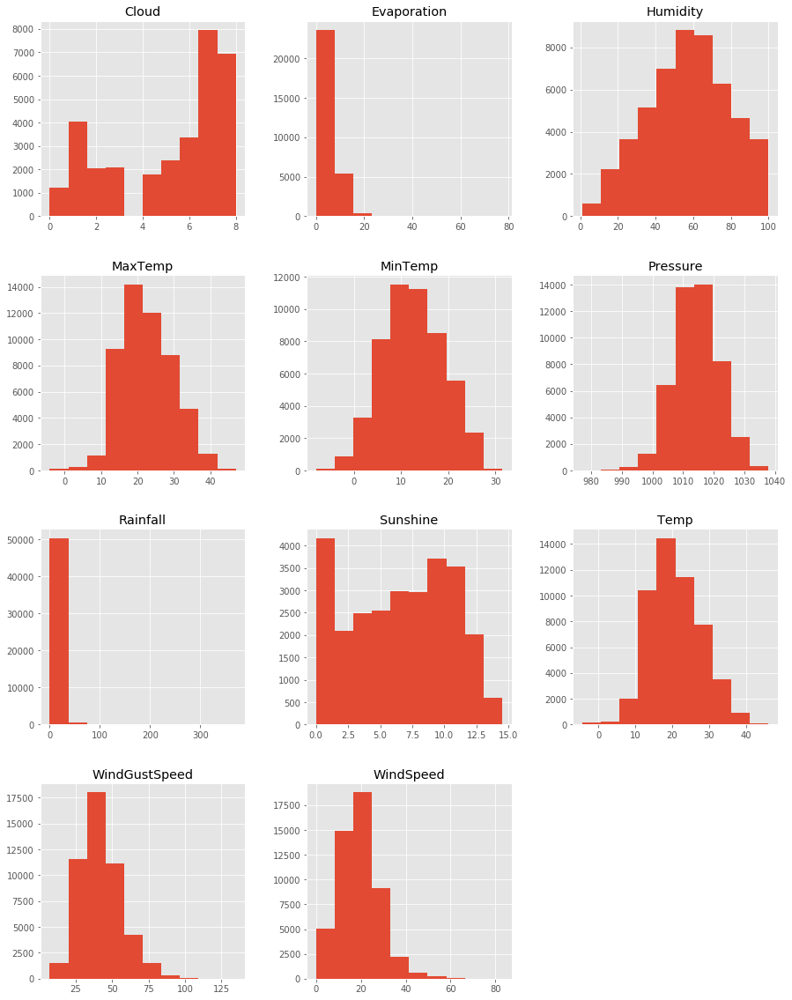

In [7]:
numeric_cols = train_df.select_dtypes([np.number]).columns
train_df[numeric_cols].hist(figsize=(15,20));

#### 1.1.3 Distribution of Categorical Variables
- The Locaition, WindGustDir, and WindDir data are relatively balanced.
- The variable Raintoday has 1.44% of "null" values.

In [8]:
col_obj=[x for x in train_df.columns.to_list() if str(train_df[x].dtype) == 'object']
train_df[col_obj].describe().T

,count,unique,top,freq
Location,51978,49,Portland,1291
WindGustDir,48380,16,W,3810
WindDir,50465,16,W,3747
RainToday,51231,2,No,35544
RainTomorrow,51978,2,No,26459


In [9]:
import plotly.express as px
for col in col_obj:
    figure = px.pie(train_df,train_df[col],title = str(col))
    figure.show()

### 1.2 Missing Values
#### 1.2.1 Summary of missing values

In [10]:
train_df.isnull().sum(axis=0)

Location             0
MinTemp            284
MaxTemp            129
Rainfall           747
Evaporation      22553
Sunshine         24875
WindGustDir       3598
WindGustSpeed     3571
WindDir           1513
WindSpeed         1024
Humidity          1429
Pressure          5066
Cloud            20130
Temp              1063
RainToday          747
RainTomorrow         0
dtype: int64

#### 1.2.2 Handling Missing values
- **Replacing missing values with a ratio of other values for variable RainToday**. Given that RainToday has only two unique values, this method is practical. And since RainToday data is imbalanced, the advantage of using this method is that we can keep the proportions of "Yes" and "No" roughly the same and avoid making the data more imbalanced.

In [12]:
# proportion of "No" and "Yes"
print(train_df['RainToday'].value_counts(normalize=True, dropna=False))

No     0.683828
Yes    0.301801
NaN    0.014371
Name: RainToday, dtype: float64


In [13]:
# use fillna with np.random.choice:
train_df['RainToday'] = train_df['RainToday'].fillna(pd.Series(np.random.choice(['No', 'Yes'], p=[0.695, 0.305], size=len(train_df))))

In [14]:
# The resulting column will have these proportions:
train_df['RainToday'].value_counts(normalize=True, dropna=False)

No     0.693928
Yes    0.306072
Name: RainToday, dtype: float64

- **Replacing missing values with mode for other categroical variables WindGustDir and WindDir.**

In [15]:
print(train_df['WindGustDir'].value_counts())
print(train_df['WindDir'].value_counts())

W      3810
N      3458
WSW    3315
S      3269
SE     3206
WNW    3197
SW     3175
NW     3161
SSE    3134
SSW    3119
E      2980
ENE    2693
NNW    2605
ESE    2479
NNE    2392
NE     2387
Name: WindGustDir, dtype: int64
W      3747
SE     3687
S      3469
WSW    3455
WNW    3434
N      3388
NW     3356
SW     3273
SSE    3223
NNW    3001
SSW    2939
NE     2828
ESE    2815
E      2805
ENE    2645
NNE    2400
Name: WindDir, dtype: int64


In [16]:
# replacing missing categorical values with majority pick
train_df['WindDir'] = train_df['WindDir'].fillna('W')  
train_df['WindGustDir'] = train_df['WindGustDir'].fillna('W')  

- **Using Mice to impute missing values for continuous data**: 
    - MICE, or Multivariate Imputation by Chained Equation (what a memorable term), is an imputation method which works by filling the missing data multiple times.The basic idea is to treat each variable with missing values as the dependent variable in a regression, with some or all of the remaining variables as its predictors. 
    - The MICE procedure cycles through these models, fitting each in turn, then uses a procedure called “predictive mean matching” (PMM) to generate random draws from the predictive distributions determined by the fitted models. These random draws become the imputed values for one imputed data set.
    - One of the advantages of this model is that the missing values are imputed based on the observed values for a given individual and the relations observed in the data for other participants, assuming the observed variables are included in the imputation model.

In [11]:
pip install fancyimpute

     |████████████████████████████████| 835 kB 2.5 MB/s eta 0:00:01
     |████████████████████████████████| 3.5 MB 3.8 MB/s eta 0:00:01
     |████████████████████████████████| 158 kB 7.5 MB/s eta 0:00:01
     |████████████████████████████████| 126 kB 3.9 MB/s eta 0:00:01
  Created wheel for fancyimpute: filename=fancyimpute-0.5.5-py3-none-any.whl size=26455 sha256=5508fee9fc06e91ca07847d7787b52868a401798f07516bb6b4db2cbe879e176
  Stored in directory: /Users/jieerchen/Library/Caches/pip/wheels/64/b2/1f/2410102ea3af9ae6df727150b501f7c6cb9b55488c3ba1c36c
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11353 sha256=f8c20ad972d1527771b226c58516fda259748a6433daf89e6d65eb790929f6b6
  Stored in directory: /Users/jieerchen/Library/Caches/pip/wheels/72/21/a8/a045cacd9838abd5643f6bfa852c0796a99d6b1494760494e0
  Created wheel for scs: filename=scs-2.1.2-cp37-cp37m-macosx_10_15_x86_64.whl size=118824 sha256=49f0e63821fa9aa46ddee9e152df8645b962a7bcb4c36ff841f040ef29be08

In [17]:
nan_cols = ['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed','Humidity','Pressure','Cloud','Temp']
from fancyimpute import IterativeImputer as MICE
train_df[nan_cols] = MICE().fit_transform(train_df[nan_cols])

/Users/jieerchen/opt/anaconda3/lib/python3.7/site-packages/sklearn/impute/_iterative.py:638: ConvergenceWarning:

[IterativeImputer] Early stopping criterion not reached.



#### 1.2.3 The resulting summary of missing values 

In [18]:
train_df.isnull().sum(axis=0)

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir          0
WindSpeed        0
Humidity         0
Pressure         0
Cloud            0
Temp             0
RainToday        0
RainTomorrow     0
dtype: int64

### 1.3 Data Outliers 
- **K-means is sensitive to outliers**: The K-mean algorithm aims to minimize the squared Euclidean distances between the observation and the centroid of cluster to which it belongs. It is sensitive to outliers. Therefore,Data outliers have a significant impact on K-means clustering. For example,Outliers can show up as a separate cluster and also cause other clusters to merge which suggests clustering was not efficient when outliers were included in data set. Hence it is better to identify and correct/remove outliers before applying K-means clustering algorithm. 

#### 1.3.1 Identify outliers using Box plots
- Box plot use the IQR method to display data and outliers(shape of the data). The lower quartile ‘Q1’ is median of first half of data. The upper quartile ‘Q3’ is median of second half of data. The interquartile range ‘IQR’ is difference of Q3 and Q1. An outlier is a point that is greater than (Q3 + 1.5*IQR) or lesser than (Q1–1.5*IQR).
- In our case, 7 out of 10 numeric variables have outliers. Rainfall, Evaportion, WindGustSpeed, WindSpeed are the four varibles have significant proportion of outliers. To minimize data lost, correcting outliers is preferred over removing outliers in this case.

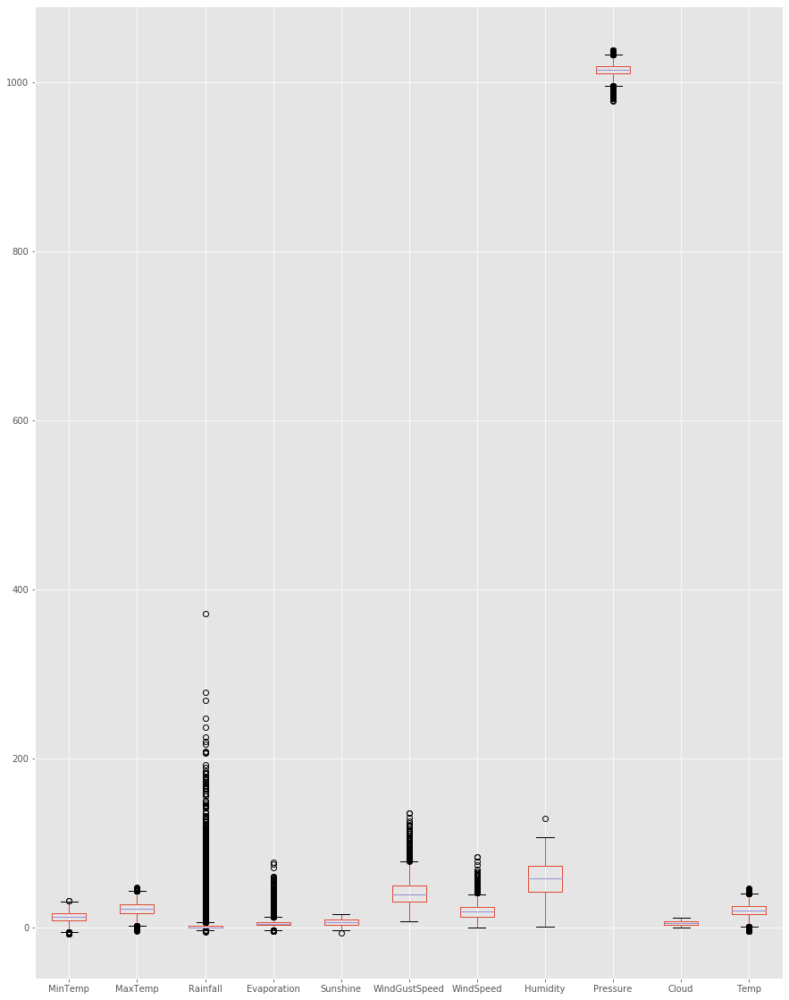

In [19]:
train_df[numeric_cols].boxplot(figsize=(15,20));

#### 1.3.2 Correcting Data Outliers 
- **Remove or Correct?** In our case, 7 out of 10 numeric variables have outliers. Rainfall, Evaportion, WindGustSpeed, WindSpeed are the four varibles have significant proportions of outliers. To minimize data lost, correcting outliers is preferred over removing outliers.
- **IQR or Z-score?** Z-score and IQR are two treatments for outliers. Zscore is comparatively less robust method because it depends on the mean and standard deviations to measure the central tendency and dispersion. Therefore, we will go with IQR.
- **Implementation of IQR**: we will use a typical strategy which is to set all outliers to a specified thresholds of the data. 

In [20]:
for target_col in numeric_cols:
    '''
    For each numeric column, we use IQR method to identify outliers.
    Column values higher than the upper bound are set to upper bound values.
    Column values lower thatn the lower bound value are set to lower bound values.
    
    '''
    lower_quartile = train_df[target_col].quantile(0.25)
    upper_quartile = train_df[target_col].quantile(0.75)
    IQR = upper_quartile - lower_quartile
    outlier_thresh = 1.5 * IQR
    # get upper/lower bound
    upper_bound = lower_quartile + outlier_thresh
    lower_bound = lower_quartile - outlier_thresh
    # winsorization
    train_df[target_col].loc[train_df[target_col] > upper_bound] = upper_bound
    train_df[target_col].loc[train_df[target_col] < lower_bound] = lower_bound

/Users/jieerchen/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:671: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



#### 1.3.3 The resulting data distribution

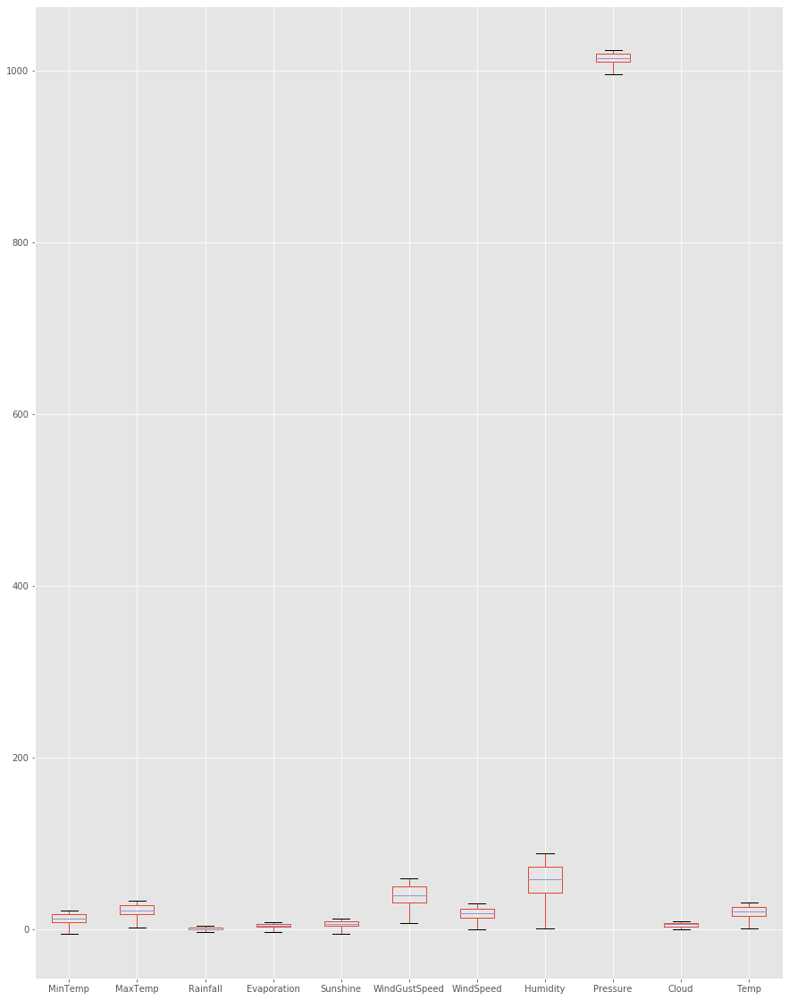

In [21]:
train_df[numeric_cols].boxplot(figsize=(15,20));

### 1.4 Feature Scaling 
- **What:** The process of transforming numerical features to use the same scale is known as feature scaling. 
- **Why:** It’s an important data preprocessing step for most distance-based machine learning algorithms because it can have a significant impact on the performance of the algorithms.
- **How:** First of all, both StandardScaler and MinMaxScaler are very sensitive to the presence of outliers. In the above step, outliers have been taken care of. Then, MinMaxScaler is chosen here because not all the shape of our features follows a normal distribution.

In [22]:
# Scale the data using MinMax
# training data
train_df_mm = train_df.copy()
mm_scaler = MinMaxScaler()
train_df_mm[numeric_cols] = mm_scaler.fit_transform(train_df_mm[numeric_cols])

### 1.5 Dimension reduction and Data Transformation

#### 1.5.1 Drop Categorical Variables Locations, WindGustDir, and WinDir
- K-means and HAC algorithm isn't directly applicable to categorical variables because Euclidean distance function isn't really meaningful for discrete variables. 
- Sklearn Decision Trees also do not handle categorical variable. At the same time, decision trees tend to overfit on data with a large number of features. Thus, doing one-hot-encoding isn't a good choice for Locations, WindGustDir and WinDir columns which have many unique values as shwon by their pie charts. 

In [23]:
# drop categorical columns
train_df_mm = train_df_mm.drop(['Location','WindGustDir','WindDir'], axis=1)

#### 1.5.2 Transformation of categorical variables into numerical 
- **Column RainToday and column RainTomorrow** have binary values "Yes" and "No". We can simply convert'Yes' to 1 and 'No' to 0. 

In [24]:
train_df_mm['RainToday'] = train_df_mm['RainToday'].map({'Yes': 1, 'No': 0})
train_df_mm['RainTomorrow'] = train_df_mm['RainTomorrow'].map({'Yes': 1, 'No': 0})

In [25]:
train_df_mm.head(3)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed,Humidity,Pressure,Cloud,Temp,RainToday,RainTomorrow
0,0.894928,0.710356,0.5,0.829804,0.710910,0.647619,0.949153,0.617143,1.000000,0.510925,0.725589,0,1
1,0.612319,0.616505,0.5,0.691872,0.780702,0.609524,0.881356,0.537143,0.666667,0.795150,0.627946,0,0
2,0.786232,0.574434,1.0,0.520509,0.357745,0.704762,0.305085,1.000000,1.000000,0.879671,0.570707,1,1


#### 1.5.3: Looking for highly correlated / redundant varaibles
- According to the correlation Matrix, we can see that some attributes are highly correlated. For example, Temp and MinTemp, MaxTemp and Evaporation. However, it is difficult to make judgements about what variables are more important over others. Based on our common sense, varaibles such MinTemp, MaxTemp and Temp are probably all matter. 
- Therefore, we will go with dimensionality reduction PCA to help us decrease the number of features.

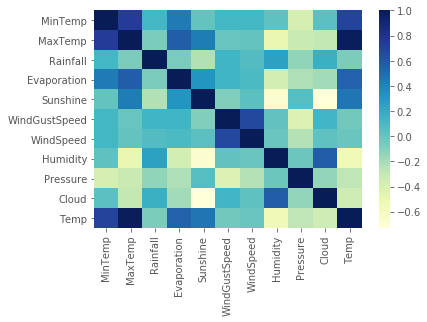

In [26]:
# correlation heatmap
corr = test_df[['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed','Humidity','Pressure','Cloud','Temp']].corr()
sns.heatmap(corr, cmap="YlGnBu")

#### 1.5.4 Split the data into training set and testing set before doing PCA

In [27]:
X = train_df_mm.drop(['RainTomorrow'], axis = 1)
X.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed,Humidity,Pressure,Cloud,Temp,RainToday
0,0.894928,0.710356,0.5,0.829804,0.710910,0.647619,0.949153,0.617143,1.000000,0.510925,0.725589,0
1,0.612319,0.616505,0.5,0.691872,0.780702,0.609524,0.881356,0.537143,0.666667,0.795150,0.627946,0
2,0.786232,0.574434,1.0,0.520509,0.357745,0.704762,0.305085,1.000000,1.000000,0.879671,0.570707,1
3,0.210145,0.425566,0.5,0.382470,0.731396,0.533333,0.644068,0.617143,0.978261,0.454371,0.449495,0
4,0.539855,0.677994,0.5,0.699136,0.754679,0.647619,0.237288,0.445714,1.000000,0.432039,0.728956,0


In [28]:
y = train_df_mm['RainTomorrow'].values
y[0:5]

array([1, 0, 1, 1, 0])

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4)
print('the shape of the features train set:', X_train.shape)
print('the shape of the target train set:',y_train.shape[0])
print('the shape of the feature test set:', X_test.shape)
print('the shape of the target test set:',y_test.shape[0])

the shape of the features train set: (41582, 12)
the shape of the target train set: 41582
the shape of the feature test set: (10396, 12)
the shape of the target test set: 10396


#### 1.5.5: Reduce Dimensionality (PCA)
- We apply principal component analysis (PCA) to find the optimal number of components which capture the greatest amount of variance in the data. 
- One of the biggest goals of PCA is to reduce the number of variables by combining them into bigger, more meaningful features. Not only that, but they are ‘orthogonal’ to each other. This means that the difference between components is as big as possible.
- The well-known benefits of PCA are reduceing overfitting and improves visualization

##### Step1: Fit our data using PCA

In [32]:
from sklearn.decomposition import PCA
# Create a PCA instance: pca
pca = PCA(n_components=12)
principalComponents = pca.fit_transform(X_train)
# Save components to a DataFrame
PCA_components = pd.DataFrame(principalComponents)

##### Step2: Decide how many features to keep based on two plots --- 7 components

- The graph shows the amount of variance captured (on the y-axis) depending on the number of components we include (the x-axis). It shows that, to get around 95% variance explained, we will need keep 7 components.

Text(0.7, 0.9, '95% cut-off threshold')

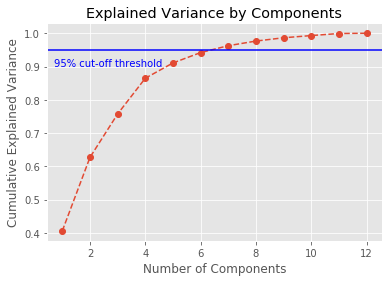

In [31]:
plt.plot(range(1,13),pca.explained_variance_ratio_.cumsum(),marker='o',linestyle='--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.axhline(y=0.95, color='b', linestyle='-')
plt.text(0.7, 0.9, '95% cut-off threshold', color = 'b', fontsize=10)

- If all components are equally important, each of the compoinents will explained around 0.09 of the total varaince. The graph shows that there are 3 component explaining more than 0.9 of the total varaince. Therefore, we will use 3 components.

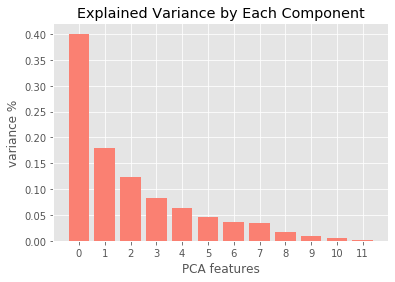

In [33]:
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='salmon')
plt.title('Explained Variance by Each Component')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
plt.show()

##### Step3: Perform PCA with the chosen number of components. 

In [33]:
# Fit the model with the selected components
# In our case that means 3 principal components
pca = PCA(n_components=3)
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [34]:
# the calculated resulting components scores for the elements
pca.transform(X_train)
# stored the calculated resulting components scores
scores_pca = pca.transform(X_train)

## Section 2: Modeling

### 2.1 K-means 

## Section 2: Modeling

#### 2.1.1 Determining the number of clusters using the Elbow Method --- 2 Clusters

- We determine the number of clusters we’d like to keep by looking for a kink or elbow in the below graph. The part of the graph before the elbow would be steeply declining, while the part after it – much smoother. In this instance, the kink comes at the 2 clusters mark. So, we’ll be keeping a three-cluster solution.

In [35]:
# K-means clustering with PCA
ks = range(1, 15)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)    
    # Fit model to samples
    model.fit(scores_pca)  
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)

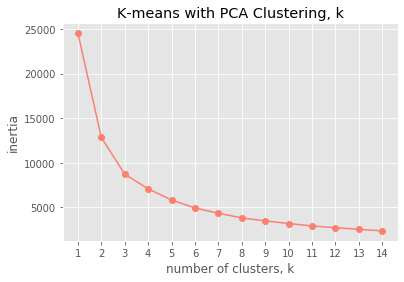

In [36]:
plt.plot(ks, inertias, '-o', color='salmon')
plt.title('K-means with PCA Clustering, k')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

#### 2.1.2: Run K-means with number of clusters equals 2 and other default parameters 

In [38]:
kmeans_pca = KMeans(n_clusters = 2, init='k-means++',random_state=42)
# fit our data with the k-means pca model
kmeans_pca.fit(scores_pca)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

#### 2.1.3: Finding the optmial parameters using Grid Search
- GridSearchaCV passes all combinations of hyperparameters one by one into the model and check the result. Finally it gives us the set of hyperparemeters which gives the best result after passing in the model.

##### Hyper-parameters
- **'init'**: The starting position of initial cluster centers affects the quality of clusters. 'k-means++' selects initial cluster centers for k-mean clustering in a smart way to speed up convergence. 'random' choose n_clusters observations (rows) at random from data for the initial centroids. 
- **'max_iter'**: Maximum number of iterations of the k-means algorithm for a single run. By doing iteration, the alogrithm will help to reduce the variance of the model.
- **'precompute_distance:'**Precompute distances (faster but takes more memory). True : always precompute distances. False : never precompute distances.
- **'algorithm'**: K-means algorithm to use. The classical EM-style algorithm is “full”. The “elkan” variation is more efficient on data with well-defined clusters. For now “auto” (kept for backward compatibiliy) chooses “elkan”. 

In [39]:
from sklearn.model_selection import GridSearchCV
parameters_grid = {'init':['k-means++', 'random'],
              'precompute_distances':['auto', True, False],
              'algorithm':['auto','full','elkan'],
              'max_iter':[100,300]}
grid_search = GridSearchCV(estimator=kmeans_pca,
                     param_grid=parameters_grid,
                     scoring='accuracy',
                     cv=3,
                     n_jobs=-1)

In [40]:
grid_search.fit(scores_pca,y_train)

GridSearchCV(cv=3, error_score=nan,
             estimator=KMeans(algorithm='auto', copy_x=True, init='k-means++',
                              max_iter=300, n_clusters=2, n_init=10,
                              n_jobs=None, precompute_distances='auto',
                              random_state=42, tol=0.0001, verbose=0),
             iid='deprecated', n_jobs=-1,
             param_grid={'algorithm': ['auto', 'full', 'elkan'],
                         'init': ['k-means++', 'random'],
                         'max_iter': [100, 300],
                         'precompute_distances': ['auto', True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='accuracy', verbose=0)

In [41]:
# store the optimal parameters
optimal_para = grid_search.best_params_
# print the parameters that returns the highest accuracy
pd.DataFrame.from_dict(optimal_para,orient='index')

,0
algorithm,auto
init,k-means++
max_iter,100
precompute_distances,auto


#### 2.1.4: Run K-means with number of clusters equals 2 and optimal parameters we found through grid_search

In [42]:
kmeans_pca_optimal = KMeans(n_clusters=2, init='k-means++', n_init=50, max_iter=100, 
                precompute_distances='auto', random_state=42, copy_x=True, algorithm='auto')
kmeans_pca_optimal.fit(scores_pca,y_train)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=100,
       n_clusters=2, n_init=50, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

#### 2.1.5 Analyze PCA and K-means Results

##### Step1: Creating a a new data frame
- The new dataframe allows us to add in the values of the separate components to our segmentation data set. The components’ scores are stored in the ‘scores PCA’ variable and are labelled as Component 1 to 7. We also append the ‘K means PCA’ labels to th new data frame.

In [43]:
# creating a new data frame with the orginal features
# add the PCA scores and assigned clusters 
X_train_pca_kmeans = pd.concat([X_train.reset_index(drop=True), pd.DataFrame(scores_pca)],axis=1)
X_train_pca_kmeans.columns.values[-7:] = ['Component1','Component2','Component3','Component4','Component5','Component6','Component7']
# Add the pca k-means clustering labels
X_train_pca_kmeans['Segement k-means PCA'] = kmeans_pca.labels_
# create a new column named ‘Segment’ 
# map the 2 clusters directly inside it
X_train_pca_kmeans['Segment'] = X_train_pca_kmeans['Segement k-means PCA'].map({0:'first',1:'second'})

In [44]:
X_train_pca_kmeans.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed,Humidity,Component1,Component2,Component3,Component4,Component5,Component6,Component7,Segement k-means PCA,Segment
0,0.536232,0.483819,0.500000,0.649455,0.419641,1.000000,0.576271,0.937143,0.475590,0.945445,0.345118,0,0.120582,0.361099,-0.649436,0,first
1,0.742754,0.710356,1.000000,0.764698,0.676668,0.819048,0.881356,0.582857,0.793478,0.567964,0.742424,1,0.569822,-0.501436,0.178983,1,second
2,0.684783,0.480583,0.722222,0.792694,0.353801,0.952381,0.813559,0.662857,1.000000,0.895361,0.436027,1,0.786929,-0.098687,-0.111627,1,second
3,1.000000,0.839806,0.500000,0.859908,0.464912,0.704762,0.440678,1.000000,0.394928,0.795150,0.772727,0,-0.157188,-0.119243,-0.363820,0,first
4,0.471014,0.448220,0.694444,0.423013,0.646199,0.857143,1.000000,0.674286,0.659420,0.795150,0.429293,1,0.773800,-0.048349,-0.130664,1,second


##### Step2: Visualize Clusters by Components 
- **Visualizing our clusters on a 2D plane:** we need to choose two components and use them as axes. The point of PCA was to help us determine the most important components. This way, we are sure that the first two components explain more variance than the third one as shown by previous plots. 
-  **How does the graph look?** There is some overlap between the green and and blue segments. Two segments are clearly separated. The spots where the two overlap are ultimately determined by the third component, which is not available on this graph.

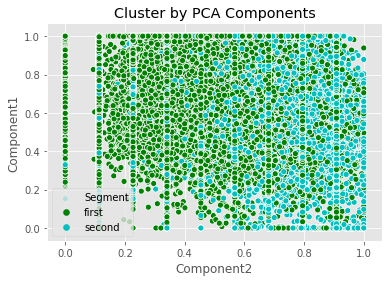

In [45]:
# The y-axis, on the other hand, is the first ‘Component 1’.
y_axis = X_train_pca_kmeans['Component1']
# The X-axis here is our ‘Component 2’
x_axis = X_train_pca_kmeans['Component2']
sns.scatterplot(x_axis, y_axis, hue=X_train_pca_kmeans['Segment'],palette=['g','c'])
plt.title('Cluster by PCA Components')
plt.show()

##### Step3: Evaluate the Model Performance
- In Scikit-Learn, all classifiers and estimators have a predict method which PCA does not. Therefore, we need to first apply PCA test data for calssification purposes.

In [46]:
X_test_kmeans = X_test.copy()
X_test_kmeans_pca = pca.transform(X_test_kmeans)
y_pred_kmeans_pca = kmeans_pca_optimal.predict(X_test_kmeans_pca)

In [67]:
print("Accuracy Score: ", round(metrics.accuracy_score(y_test,y_pred_kmeans_pca),4))
print("Precision Score: ", round(metrics.precision_score(y_test,y_pred_kmeans_pca),4))
print("Recall Score: ", round(metrics.recall_score(y_test,y_pred_kmeans_pca),4))
print("F1 Score: ", round(metrics.f1_score(y_test,y_pred_kmeans_pca),4))

Accuracy Score:  0.6622
Precision Score:  0.7408
Recall Score:  0.4706
F1 Score:  0.5755


In [48]:
print(metrics.classification_report(y_test, y_pred_kmeans_pca,zero_division=0))

              precision    recall  f1-score   support

           0       0.63      0.84      0.72      5336
           1       0.74      0.47      0.58      5060

    accuracy                           0.66     10396
   macro avg       0.68      0.66      0.65     10396
weighted avg       0.68      0.66      0.65     10396



### 2.2 Herarchical Agglomerative Clustering (HAC)

There are two types of hierarchical clustering: Agglomerative and Divisive. In the former, data points are clustered using a bottom-up approach starting with individual data points, while in the latter top-down approach is followed where all the data points are treated as one big cluster and the clustering process involves dividing the one big cluster into several small clusters.

In this report we will focus on agglomerative clustering that involves the bottom-up approach.

#### 2.2.1 Run Agglomerative Clustering with sample data 
The linkage method takes the dataset and the method to minimize distances as parameters. We use 'ward' as the method since it minimizes then variants of distances between the clusters.

In [62]:
from sklearn.cluster import AgglomerativeClustering
cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
hac = cluster.fit(X_train)

#### 2.2.2 Summary of evaluation metrics

In [63]:
import sklearn.metrics as sm
#accuracy of the model

print("Accuracy Score: ", round(metrics.accuracy_score(y_train,(cluster.labels_)),4))
print("Precision Score: ", round(metrics.precision_score(y_train,(cluster.labels_)),4))
print("Recall Score: ", round(metrics.recall_score(y_train,(cluster.labels_)),4))
print("F1 Score: ", round(metrics.f1_score(y_train,(cluster.labels_)),4))

Accuracy Score:  0.6595
Precision Score:  0.7481
Recall Score:  0.4641
F1 Score:  0.5729


#### 2.2.3 Create Dendrogram

-  Values on the tree depth axis correspond to distances between clusters.
- The key to interpreting a dendrogram is to focus on the height at which any two objects are joined together.
- The consequence of the information loss is that the dendrograms are most accurate at the bottom, showing which items are very similar.

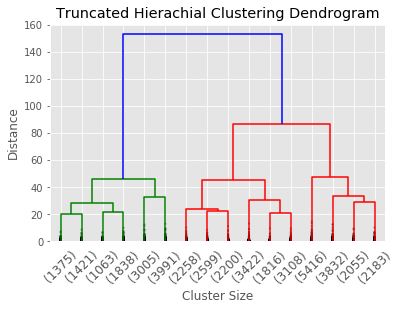

In [65]:
from scipy.cluster.hierarchy import dendrogram, linkage
hc = linkage(X_train,"ward")
#Plotting the dendrogram
dendrogram(hc,truncate_mode= "lastp", p = 16, leaf_rotation=45,leaf_font_size=12, show_contracted=True)
plt.title("Truncated Hierachial Clustering Dendrogram")
plt.xlabel("Cluster Size")
plt.ylabel("Distance")
#divide the cluster
plt.axhline(y=450)
plt.axhline(350)
plt.axhline(200)
plt.show(125)

### 2.3 Decision Trees

#### 2.3.1: Build the model and train the model with different max depth ranging from 1 to 10

In [41]:
md = 10
mean_acc = np.zeros((md-1))
std_acc = np.zeros((md-1))
ConfustionMx = [];
for n in range(1,md):
    #Train Model and Predict  
    tree = DecisionTreeClassifier(criterion="entropy", max_depth = n).fit(X_train,y_train)
    yhat=tree.predict(X_test)
    mean_acc[n-1] = metrics.accuracy_score(y_test, yhat)
    std_acc[n-1]=np.std(yhat==y_test)/np.sqrt(yhat.shape[0])
mean_acc

array([0.7184494 , 0.7184494 , 0.73836091, 0.74547903, 0.75192382,
       0.75404002, 0.75990766, 0.75933051, 0.76000385])

#### 2.3.2: Plot model accuracy for different number of max depth¶
- When max_depth equals 10, the model has the highest accuracy.
- When max_depth is between 7 and 10, the accuracy is high.

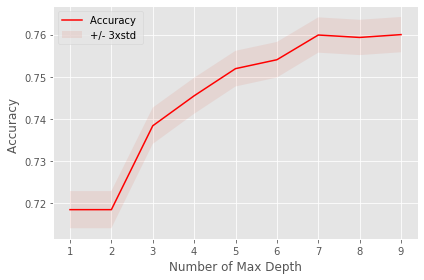

In [42]:
plt.plot(range(1,md),mean_acc,'r')
plt.fill_between(range(1,md),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Max Depth')
plt.tight_layout()
plt.show()

#### 2.3.3: Comprehensive Hyperparameter Tuning using Grid Search

##### Hyper-parameters
- **criterion**: Decision tree nodes are split by using impurity. The criterion function measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain. 
- **max_depth**: The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples. Purning helps to aviod overfitting and setting max_depth is an effective way to stop a tree from growing too much and learning the noise in data.
- **min_samples leaf**: min_samples_leaf is also used to control over-fitting by defining that each leaf has more than one element. Thus ensuring that the tree cannot overfit the training dataset by creating a bunch of small branches exclusively for one sample each. 

In [57]:
dec_tree = DecisionTreeClassifier()
parameters_grid_tree = {'criterion': ['gini', 'entropy'],
              'min_samples_split': [2, 10, 20],
              'max_depth': [6, 7, 8, 9, 10],
              'min_samples_leaf': [1, 5, 10],
              'max_leaf_nodes': [2, 5, 10, 20]}
grid_tree = GridSearchCV(dec_tree, parameters_grid_tree, cv=10, scoring='accuracy')
grid_tree.fit(X_train, y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
             param_grid={'criterion': ['gini', 'entropy'],
                  

##### Hyper-parameters for Decision Tree

In [61]:
dict_dt = {}
for hps, values in grid_tree.best_params_.items():
    dict_dt[hps]=values
pd.DataFrame.from_dict(dict_dt,orient='index')

,0
criterion,entropy
max_depth,6
max_leaf_nodes,20
min_samples_leaf,1
min_samples_split,2


#### 2.3.4: Build the model with optimal paramters found 

In [62]:
tree_optimal = DecisionTreeClassifier(class_weight=None, criterion='entropy',
                             max_depth=6, max_leaf_nodes=20,
                             min_samples_leaf=1, min_samples_split=2,
                             min_weight_fraction_leaf=0.0,
                             random_state=None, splitter='best')
tree_optimal.fit(X_train, y_train)
y_pred_dt = tree_optimal.predict(X_test)

In [64]:
print(metrics.classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.77      0.73      0.75      5336
           1       0.73      0.77      0.75      5060

    accuracy                           0.75     10396
   macro avg       0.75      0.75      0.75     10396
weighted avg       0.75      0.75      0.75     10396



#### 2.3.5: Visualize the decision Tree

##### Intrepretation of Decision Tree graph
1. **Some definitions:** The top node, most commonly referred to as the root node, at a depth of zero. A node is a point along the decision tree where a question is asked. This action divides the data into smaller subsets. 
2. **Characteristics contained at each box:** Take top root as an example. First, Humidity <= 0.73 is the first question the decision tree ask. Based on the result, it either follows the true(left) or the false(right) path. Second, entropy is measured between 0 and 1. The entropy here is approximately 1.0. This is considered a high entropy , a high level of disorder( meaning low level of purity). Third, since our data set contains 41582 samples, this value is set to 41582. Fourth, the value list tells you how many samples at the given node fall into each category. 21123 samples belongs to the class 0 and 20459 samples belong to the class 1.


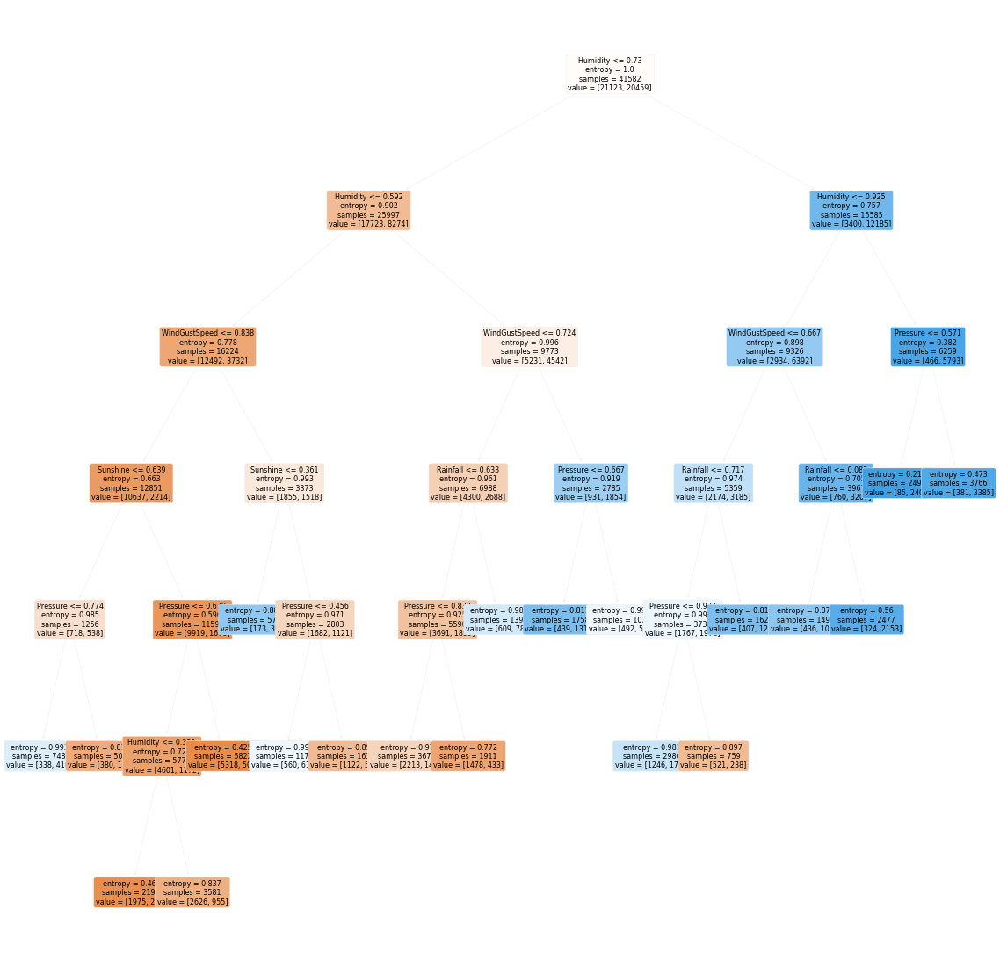

In [66]:
from sklearn import datasets
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
fig = plt.figure(figsize=(20,20))
_ = tree.plot_tree(tree_optimal, filled=True, rounded=True, feature_names=X_train.columns, fontsize=8)

In [100]:
text_representation = tree.export_text(tree_optimal)
print(text_representation)

|--- feature_7 <= 0.73
|   |--- feature_7 <= 0.59
|   |   |--- feature_5 <= 0.84
|   |   |   |--- feature_4 <= 0.64
|   |   |   |   |--- feature_8 <= 0.77
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_8 >  0.77
|   |   |   |   |   |--- class: 0
|   |   |   |--- feature_4 >  0.64
|   |   |   |   |--- feature_8 <= 0.68
|   |   |   |   |   |--- feature_7 <= 0.34
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_7 >  0.34
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_8 >  0.68
|   |   |   |   |   |--- class: 0
|   |   |--- feature_5 >  0.84
|   |   |   |--- feature_4 <= 0.36
|   |   |   |   |--- class: 1
|   |   |   |--- feature_4 >  0.36
|   |   |   |   |--- feature_8 <= 0.46
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_8 >  0.46
|   |   |   |   |   |--- class: 0
|   |--- feature_7 >  0.59
|   |   |--- feature_5 <= 0.72
|   |   |   |--- feature_2 <= 0.63
|   |   |   |   |--- feature_8 <= 0.84
|   |   |   |   |   

#### 2.3.6 Model Performance

##### Method 2: Use ROC Curve to evaluate the performance of decision tree
- ROC tells us how good the model is for distinguishing the given classes, in terms of the predicted probability. AUC is the area covered between the straight line (ROC) and the axis. The bigger the area covered, the better the machine learning models is at distinguishing the given classes. Ideal value for AUC is 1.
- In our case, the AUC is 0.83 (out of 1).

In [101]:
# Prediction on the test data.
probs_tree = tree_optimal.predict_proba(X_test)
# Keep Probabilities of the positive class only
probs_tree = probs_tree[:, 1]
# Compute the AUC Score
auc = roc_auc_score(y_test, probs_tree)
print('Area Under the Curve (AUC): %.2f' % auc)

Area Under the Curve (AUC): 0.83


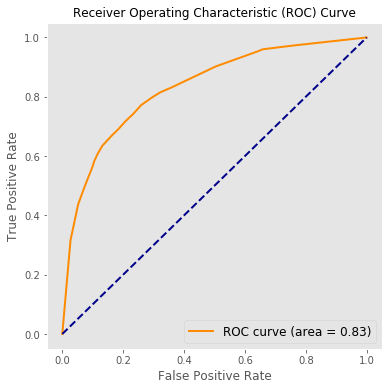

In [257]:
# Get the ROC Curve 
fpr, tpr, thresholds = roc_curve(y_test, probs_tree)

# define the roc curve function
def plot_roc_curve(fpr, tpr):
    plt.figure(figsize=(6,6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = 0.83)')
    plt.plot([0, 1], [0, 1], color='darkblue', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate',fontdict={'size':12})
    plt.ylabel('True Positive Rate', fontdict={'size':12})
    plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=12)
    plt.legend(loc='lower right',fontsize=12)
    plt.grid()
    plt.show()

# Plot ROC Curve using our defined function
plot_roc_curve(fpr, tpr)

### 3.0 Interpretation 

### 3.1 Discussion on Evaluation Metrics
- **Starting with defining negative and positive:** In our case of weather forcast, we defined RainTomorrow == "Yes"(or 1) as positive and "RainTomorrow=="No"(or 0) as negative. 
- **Accuracy (Number of correct predictions / Total number of predictions):** Accuracy tells us the friction of correct weather predictions we made. In imbalanced dataset, using accuracy as a performace measure is not a good idea. In our case, the number of positive values (49.1%) and negative values (50.9%) are approximately same. Thus, we can consider accuray as a good indicator for our model performance.  
- **Precision (or positive predictive value) = TP/ (TP+FN)**: This number tells us that how many of our positive prediction are relevant. When we predict rains tomrrow, the friaction of times that we are right. 
- **Recall (or sensitivity) = TP/(TP+NA)** This metric reveals that how many postive cases were correctly predicted. When there were rains tomorrow, the friction of times that we have correctly predicted the rains.
- **Relationship between Precsion and Recall:** Higher precision means that an algorithm returns more relevant results than irrelevant ones, and high recall means that an algorithm returns most of the relevant results (whether or not irrelevant ones are also returned). Often, there is an inverse relationship between precision and recall, where it is possible to increase one at the cost of reducing the other. 
- **Precsion or Recall or F1-score?** To decide which one of them is more important, we have to think about the cost of a wrong rain prediction and the cost of missing the prediction of rains. It seems like the cost of missing a rain prediction is slightly higher. In this case, we can either priorize Recall or look at F1-score which is a function of precision and recall. F1-score comes handy when we want to seek a balance between Precision and Recall

### 3.2 Model Performance Summary 

#### Overall, the Decision Tree model has the best performance. Among the three models, the ranking for each score are 

In [68]:
perform = {'metrics': ['Accuracy','Precision','Recall','F1-Score'], 
           'Kmeans': [0.66, 0.74,0.4706,0.58],
           'Decision_tree':[0.75,0.75,0.75,0.75],
          'HAV':[0.66,0.74,0.47,0.57]}
perform = pd.DataFrame(data=perform)
perform

,metrics,Kmeans,Decision_tree,HAV
0,Accuracy,0.6600,0.75,0.66
1,Precision,0.7400,0.75,0.74
2,Recall,0.4706,0.75,0.47
3,F1-Score,0.5800,0.75,0.57
